# Absolute player positions dataframe in a match

- Where do players go?
- What is each team dynamic?

This notebook explores match-specific positions of each player/team.

In [1]:
import utils
import pickle
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
import numpy as np


In [2]:
!pip install pymongo
import pymongo

dbname = 'lol2'
user = 'lol2i'
passw = 'GoogleTest19'
ip = "5.196.92.209"
port = 35420

client = pymongo.MongoClient(ip,port,username=user,password=passw,authSource=dbname)

db = client[dbname]

game = db.timelines.find({'gameId': 4060650926})[0]

In [3]:
db.games.find()[0]

{'_id': ObjectId('5cfed46ebfb9b203ceb7012f'),
 'gameId': 4060650926,
 'platformId': 'EUW1',
 'gameCreation': 1560186127816,
 'gameDuration': 1887,
 'queueId': 430,
 'mapId': 11,
 'seasonId': 13,
 'gameVersion': '9.11.275.6613',
 'gameMode': 'CLASSIC',
 'gameType': 'MATCHED_GAME',
 'teams': [{'teamId': 100,
   'win': 'Win',
   'firstBlood': True,
   'firstTower': True,
   'firstInhibitor': True,
   'firstBaron': True,
   'firstDragon': True,
   'firstRiftHerald': True,
   'towerKills': 11,
   'inhibitorKills': 2,
   'baronKills': 1,
   'dragonKills': 4,
   'vilemawKills': 0,
   'riftHeraldKills': 1,
   'dominionVictoryScore': 0,
   'bans': []},
  {'teamId': 200,
   'win': 'Fail',
   'firstBlood': False,
   'firstTower': False,
   'firstInhibitor': False,
   'firstBaron': False,
   'firstDragon': False,
   'firstRiftHerald': False,
   'towerKills': 2,
   'inhibitorKills': 0,
   'baronKills': 0,
   'dragonKills': 0,
   'vilemawKills': 0,
   'riftHeraldKills': 0,
   'dominionVictoryScore':

In [4]:
game.keys()

dict_keys(['_id', 'userName', 'gameId', 'timeline'])

In [5]:
playerids = utils.getPlayerIds(game['timeline']['frames'])
playerids

['1', '2', '3', '4', '5', '6', '7', '8', '9', '10']

In [6]:
positions = utils.getAllPlayersPositions(game, playerids)

In [7]:
df = utils.dataFramefromAllPositions(positions,playerids)

In [8]:
df['team'] = df.playerid.apply(lambda x: 'blue' if int(x)<6 else 'red')

In [9]:
df.head()

,playerid,x,y,timestamp,team
0,1,560,581,0,blue
1,1,6577,6644,60026,blue
2,1,7320,7077,120041,blue
3,1,7347,7600,180055,blue
4,1,6876,7198,240065,blue


In [10]:
game.keys()

dict_keys(['_id', 'userName', 'gameId', 'timeline'])

In [40]:
gameids = db.games.find()#{'gameId': 4060650926})[0]
storedids = []
import random
maxids = 100
i = 0
for g in gameids:
    if(i<maxids and bool(random.getrandbits(1))):
        storedids.append(g['gameId'])
        i += 1
    elif(i>=maxids):
        break

In [41]:
storedids

[4060611412,
 4059993419,
 4057297697,
 4057173351,
 4057135240,
 4057077504,
 4057060901,
 4052604204,
 4051412778,
 4050142848,
 4049222647,
 4048876408,
 4048828123,
 4048840620,
 4048708071,
 4048451944,
 4048359840,
 4048150711,
 4048073332,
 4048065084,
 4047977268,
 4047959002,
 4047917904,
 4047840357,
 4047792273,
 4047676230,
 4047658880,
 4046546985,
 4046497966,
 4046433979,
 4046377776,
 4042655771,
 4042579266,
 4042022456,
 4041161706,
 4041069028,
 4040825114,
 4037566337,
 4035017654,
 4034668569,
 4032828531,
 4032775372,
 4032717347,
 4032545016,
 4026736912,
 4026722848,
 4026696085,
 4025951690,
 4025234057,
 4023968529,
 4023666455,
 4023619672,
 4023574615,
 4023476818,
 4022341584,
 4022274209,
 4022229966,
 4022174607,
 4022142568,
 4021350799,
 4021250489,
 4020935387,
 4020907959,
 4020920784,
 4020189378,
 4020164411,
 4020102590,
 4020053393,
 4020023775,
 4019846846,
 4019826446,
 4019784242,
 4019756737,
 4019740925,
 4019088420,
 4019043547,
 4019013356,

In [12]:
gameid.keys()

dict_keys(['_id', 'gameId', 'platformId', 'gameCreation', 'gameDuration', 'queueId', 'mapId', 'seasonId', 'gameVersion', 'gameMode', 'gameType', 'teams', 'participants', 'participantIdentities'])

In [13]:
gameid['teams'][0]['win']

'Win'

In [14]:
df['win'] = df.playerid.apply(lambda x: gameid['teams'][0]['win'] if int(x)<6 else gameid['teams'][1]['win'])

In [15]:
# positions at middle stage
dfmid = df[df.timestamp//60000 +1 == 20]
dfmid

,playerid,x,y,timestamp,team,win
19,1,883,848,1140349,blue,Win
19,2,9496,10129,1140349,blue,Win
19,3,8106,9984,1140349,blue,Win
19,4,10027,9891,1140349,blue,Win
19,5,9004,9969,1140349,blue,Win
19,6,13934,14010,1140349,red,Fail
19,7,10843,10580,1140349,red,Fail
19,8,9534,9274,1140349,red,Fail
19,9,10994,11128,1140349,red,Fail
19,10,8273,10319,1140349,red,Fail


In [16]:
# positions at late stage
dflate = df[df.timestamp//60000 +1 == 30]
dflate

,playerid,x,y,timestamp,team,win
29,1,11820,7720,1740537,blue,Win
29,2,11568,7685,1740537,blue,Win
29,3,7721,10298,1740537,blue,Win
29,4,6999,12492,1740537,blue,Win
29,5,7474,6779,1740537,blue,Win
29,6,10871,7617,1740537,red,Fail
29,7,11415,8124,1740537,red,Fail
29,8,12197,8680,1740537,red,Fail
29,9,11583,7714,1740537,red,Fail
29,10,11483,8703,1740537,red,Fail


In [17]:
def res_median(df,gamephase):
    """get dataframe with coordinates per gamer (10 row) into specific game phase 
       and get median of point per team  
    """
    
    df_ = df[df.timestamp//60000 +1 == gamephase]

    x_red = df_[df_.team=="red"].x
    y_red = df_[df_.team=="red"].y

    x_blue = df_[df_.team=="blue"].x
    y_blue = df_[df_.team=="blue"].y

    res_red = stats.siegelslopes(y_red, x_red)
    res_blue = stats.siegelslopes(y_blue, x_blue)
    
    return (df_, x_red, y_red, x_blue, y_blue, res_red, res_blue)

In [18]:
df.head()

,playerid,x,y,timestamp,team,win
0,1,560,581,0,blue,Win
1,1,6577,6644,60026,blue,Win
2,1,7320,7077,120041,blue,Win
3,1,7347,7600,180055,blue,Win
4,1,6876,7198,240065,blue,Win


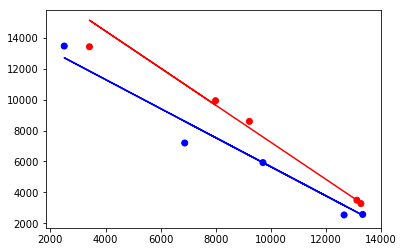

In [19]:
# df_earlym and linear regression with median
df_,x_red, y_red, x_blue, y_blue,res_red, res_blue = res_median(df,5)
# plot early phase

fig, ax = plt.subplots()

ax.plot(x_red, res_red[1] + res_red[0] * x_red, 'r-')
ax.plot(x_blue, res_blue[1] + res_blue[0] * x_blue, 'b-')

plt.scatter(df_.x,df_.y,color=df_.team)

In [20]:
!pwd

/home/jovyan/data_shared/students/LOL_project_DO_NOT_DELETE/LOL_PROJECT


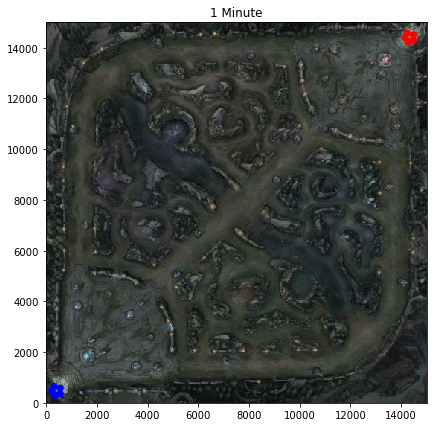

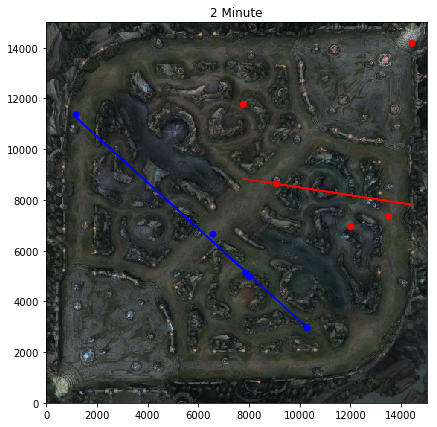

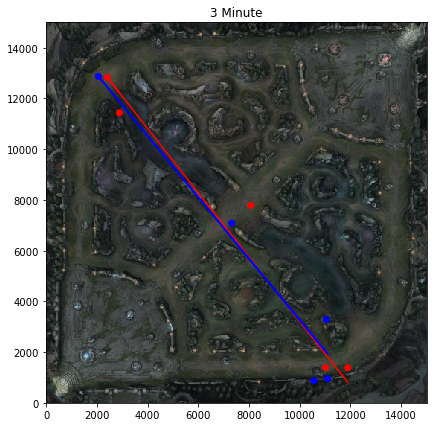

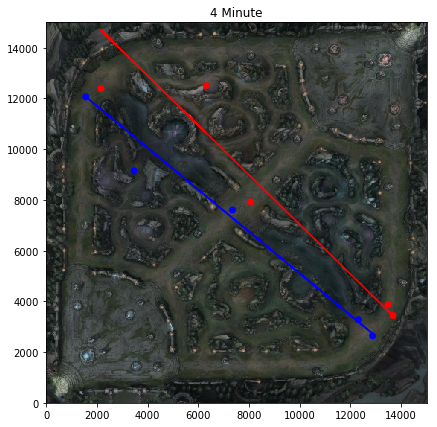

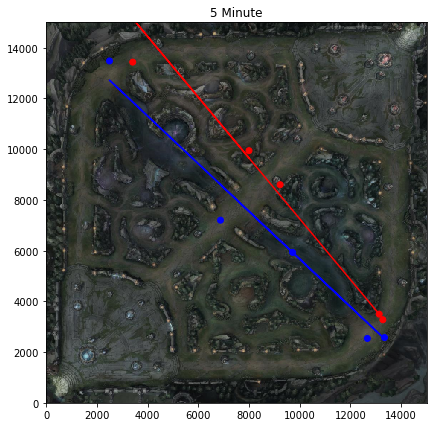

...

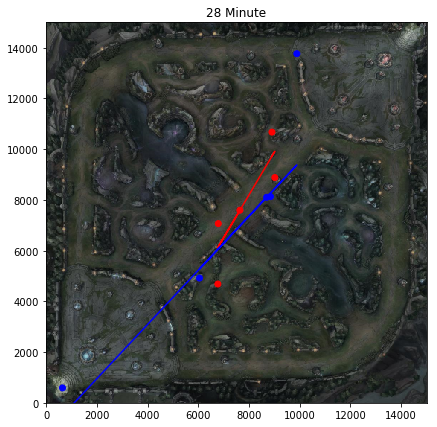

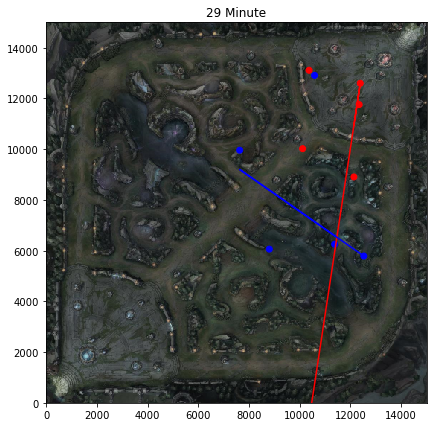

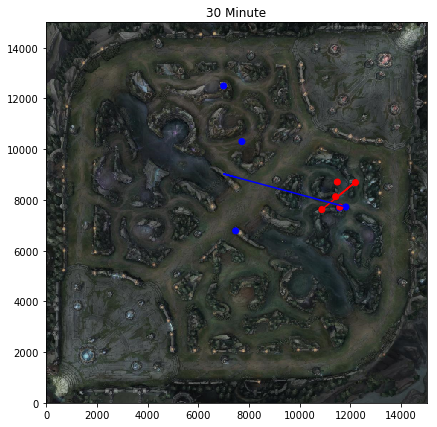

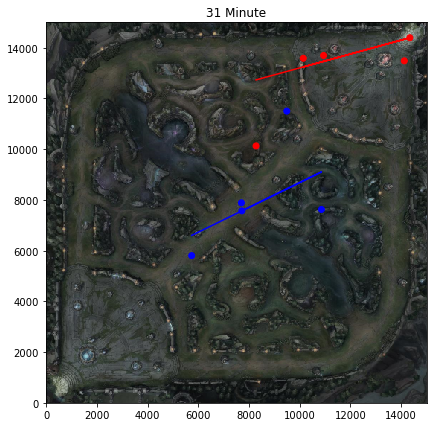

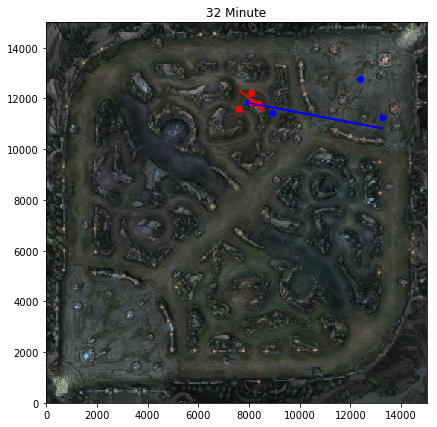

In [21]:

for phase in range(1,max(df.timestamp)//60000+2):
    # df_mid and linear regression with median
    df_,x_red, y_red, x_blue, y_blue,res_red, res_blue = res_median(df,phase)
    # plot early phase
    
    img = plt.imread("images/map.png")
    fig, ax = plt.subplots(figsize=(7,7))
    ax = plt.gca()

    ax.set_title(str(phase) + ' Minute')
    ax.set
    ax.plot(x_red, res_red[1] + res_red[0] * x_red, 'r-')
    ax.plot(x_blue, res_blue[1] + res_blue[0] * x_blue, 'b-')

    plt.scatter(df_.x,df_.y,color=df_.team)
    ax.imshow(img, extent=[0, 15000, 0, 15000])
    if phase==17:
        

    plt.show();

In [ ]:
df_,x_red, y_red, x_blue, y_blue,res_red, res_blue = res_median(df,)

In [ ]:
def animation(i):
    # df_ and linear regression with median
    # plot phase
    
    img = plt.imread("images/map.png")
#     fig, ax = plt.subplots(figsize=(7,7))
    ax = plt.gca()

    ax.set_title(i)
    x_red = df[df.team=="red"].x
    y_red = df[df.team=="red"].y

    x_blue = df[df.team=="blue"].x
    y_blue = df[df.team=="blue"].y

    res_red = stats.siegelslopes(y_red, x_red)
    res_blue = stats.siegelslopes(y_blue, x_blue)
    ax.plot(x_red, res_red[1] + res_red[0] * x_red, 'r-') #reg_red
    ax.plot(x_blue, res_blue[1] + res_blue[0] * x_blue, 'b-') #reg_blue

    plt.scatter(df.x,df.y,color=df.team) #points
    
    ax.imshow(img, extent=[0, 15000, 0, 15000])

#     plt.show();

In [ ]:
def animation2(phase):

        # df_mid and linear regretion with median
        df_,x_red, y_red, x_blue, y_blue,res_red, res_blue = res_median(df,phase)
        # plot early phase

        img = plt.imread("images/map.png")
        fig, ax = plt.subplots(figsize=(7,7))
        ax.imshow(img, extent=[0, 15000, 0, 15000])
        ax = plt.gca()

        ax.set_title(str(phase) + ' Minute')
        
        ax.plot(x_red, res_red[1] + res_red[0] * x_red, 'r-')
        ax.plot(x_blue, res_blue[1] + res_blue[0] * x_blue, 'b-')

        plt.scatter(df_.x,df_.y,color=df_.team)
        

        plt.show();

In [ ]:
def init():
    players.set_data([],[])
    return players

In [ ]:
def animate5(i):
    data = df[df.timestamp//60000 +1 == i] #select data range
    players.set_data

In [27]:
def animate3(gamephase):
    data = df[df.timestamp//60000 +1 == gamephase] #select data range
    ax = sns.scatterplot(x=data.x, y=data.y, data=data, hue=data.team)
    ax.set_title(str(phase) + ' Minute')

    df_,x_red, y_red, x_blue, y_blue,res_red, res_blue = res_median(df,gamephase)    
    line1, = ax.plot(x_red, res_red[1] + res_red[0] * x_red, 'r-')
    line2, = ax.plot(x_blue, res_blue[1] + res_blue[0] * x_blue, 'b-')
    return ax, line1, line2


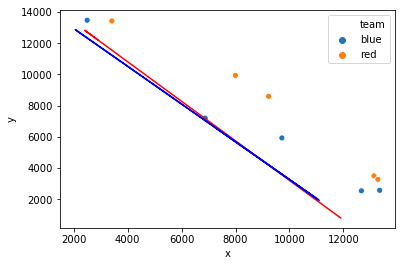

In [30]:
data = df[df.timestamp//60000 +1 == 5] #select data range
ax = sns.scatterplot(x=data.x, y=data.y, data=data, hue=data.team)

df_,x_red, y_red, x_blue, y_blue,res_red, res_blue = res_median(df,3)    
ax.plot(x_red, res_red[1] + res_red[0] * x_red, 'r-')
ax.plot(x_blue, res_blue[1] + res_blue[0] * x_blue, 'b-')

Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/matplotlib/cbook/__init__.py", line 215, in process
    func(*args, **kwargs)
  File "/opt/conda/lib/python3.7/site-packages/matplotlib/animation.py", line 999, in _start
    self._init_draw()
  File "/opt/conda/lib/python3.7/site-packages/matplotlib/animation.py", line 1740, in _init_draw
    self._draw_frame(next(self.new_frame_seq()))
  File "/opt/conda/lib/python3.7/site-packages/matplotlib/animation.py", line 1762, in _draw_frame
    self._drawn_artists = self._func(framedata, *self._args)
  File "<ipython-input-27-797d55ecfaa9>", line 3, in animate3
    ax = sns.scatterplot(x=data.x, y=data.y, data=data, hue=data.team)
  File "/opt/conda/lib/python3.7/site-packages/seaborn/relational.py", line 1335, in scatterplot
    alpha=alpha, x_jitter=x_jitter, y_jitter=y_jitter, legend=legend,
  File "/opt/conda/lib/python3.7/site-packages/seaborn/relational.py", line 852, in __init__
    x, y, hue, size, styl

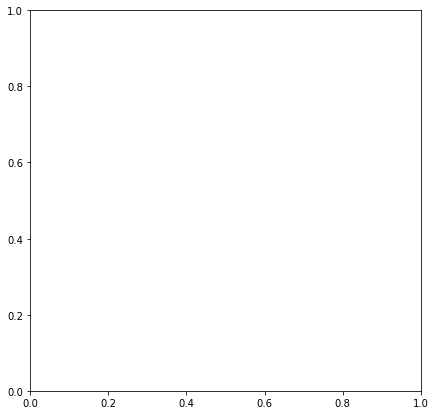

In [29]:
img = plt.imread("images/map.png")
fig, ax = plt.subplots(figsize=(7,7))
# ax = plt.gca()
# ax.imshow(img, extent=[0, 15000, 0, 15000])

ani = matplotlib.animation.FuncAnimation(fig, animate3, np.arange(0,32), repeat = True)
plt.show()

In [ ]:
def main():    
    fig = plt.figure(figsize=(7,7))
    x = df[df.timestamp//60000 +1 == gamephase].x
    y = df[df.timestamp//60000 +1 == gamephase].y
    scat = sns.scatterplot(x=x, y=y, data=df, hue=df.team)

    ani = matplotlib.animation.FuncAnimation(fig, update_plot, frames=320,fargs=(scat))
    plt.show()
    
def update_plot(i, df, scat):
    scat.set_array(df[i])
    return scat,

main()

In [ ]:
fig, ax = plt.subplots(figsize=(7,7))
img = plt.imread("images/map.png")
ax = plt.gca()
ax.imshow(img, extent=[0, 15000, 0, 15000])
ani = matplotlib.animation.FuncAnimation(fig, animate3, interval=32) 
plt.show()

In [ ]:
def animation4(i):
    for phase in range(1,max(df.timestamp)//60000+2):
        # df_mid and linear regretion with median
        df_,x_red, y_red, x_blue, y_blue,res_red, res_blue = res_median(df,phase)
        # plot early phase

        img = plt.imread("images/map.png")
        fig, ax = plt.subplots(figsize=(7,7))
        ax = plt.gca()

        ax.set_title(str(phase) + ' Minute')
        ax.set
        ax.plot(x_red, res_red[1] + res_red[0] * x_red, 'r-')
        ax.plot(x_blue, res_blue[1] + res_blue[0] * x_blue, 'b-')

        plt.scatter(df_.x,df_.y,color=df_.team)
        ax.imshow(img, extent=[0, 15000, 0, 15000])

#         plt.show();
        
ani = matplotlib.animation.FuncAnimation(fig, animation4, frames=32)
plt.show()

In [ ]:
df['intplayer'] = df.playerid.astype(int)

In [ ]:
plt.figure(figsize=(12,8))
pid = '1'
orderedpos = sorted(list(zip(df[df.playerid==pid].x,df[df.playerid==pid].y)),key=lambda x:x[0])
ax = sns.lineplot(x=[op[0] for op in orderedpos], y=[op[1] for op in orderedpos])

In [ ]:
df.reset_index(drop=True, inplace=True)
df.head(40)

In [ ]:
!pip install ffmpeg
!pip install imagemagick